# Magic voice

Recently I bought a KaraOK phone with magic voice function as a toy of my daughter, and I'm very curious about its working principle. Python in Jupiter notebook is a very good platform for such research.


In [1]:
import numpy as np
import scipy, scipy.io, scipy.io.wavfile, scipy.signal
import IPython
import matplotlib.pyplot as plt
from vscode_audio import Audio
from lpc_helper import *
plt.rcParams['figure.figsize'] = [48, 8]
plt.rcParams['figure.dpi'] = 100 
%matplotlib inline


# Reference - A
https://wenku.baidu.com/view/ae0b640b4a7302768f993906.html

## Method in 2.2
Normal AM modulation is not good because:

    - carrier frequency is introduced (can be removed)
    - negative band will be reflected into positive band (cannot removed).

Frequency shifting by multiplication by sinusoid:

$$
e^{j\omega_{0}t}x(t) \xtofrom{CTFT} X(j(\omega - \omega_{0}))
$$

for real signal:
$$
cos(\omega_{0}t)x(t) = \frac{1}{2} (e^{j\omega_{0}t} + e^{-j\omega_{0}t})x(t)
 \xtofrom{CTFT}
 \frac{1}{2} (X(j(\omega - \omega_{0})) + X(j(\omega + \omega_{0})))
$$

This is also not good because:

 - harmonics are not in harmonic anymore after shift (robotic voice)
 - negative frequency band will be shifted/mixed into positive part

https://www.allaboutcircuits.com/textbook/radio-frequency-analysis-design/radio-frequency-modulation/amplitude-modulation-theory-time-domain-frequency-domain/


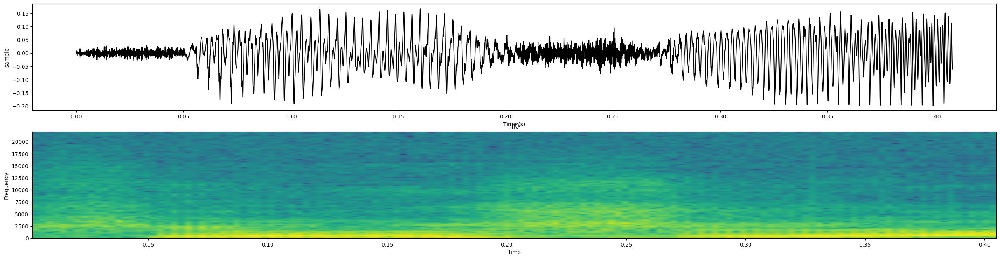

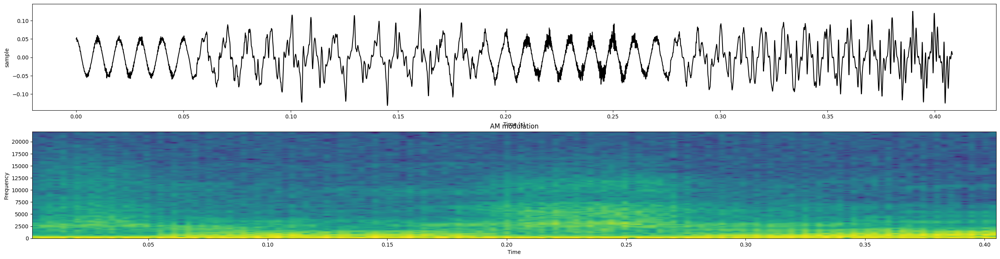

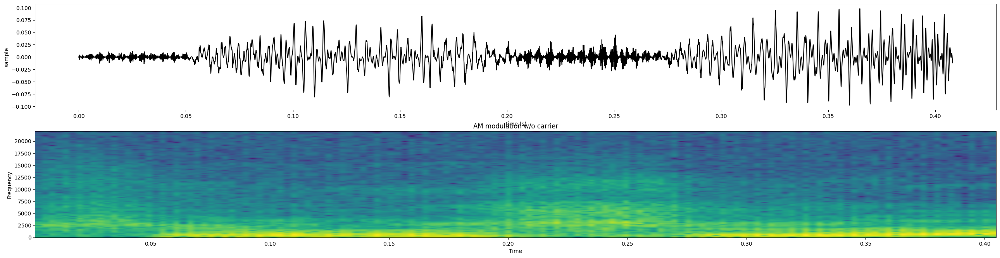

In [2]:
m0 = load_wave("wavs/m0.wav"); sr = 44100
m0 = m0[4000:22000]
play_sound(m0, rate=sr, name="m0", spectrum=1)


# f0=10*1000 can see frequency spectrum change by modulation very clearly
f0 = 0.1*1000
carrier = np.cos(2*np.pi*f0*np.arange(len(m0))/(sr))*0.5

# AM modulation - carrier + negative part
play_sound((0.1 + m0)*carrier, rate=sr, name="AM modulation", spectrum=1)

# Frequency shifting
play_sound(m0*carrier, rate=sr, name="AM modulation w/o carrier", spectrum=1)

# Method in 2.3

Time-scaling can scale frequency spectrum very well:

$$
x(at) \xtofrom{Fourier} \frac{1}{|a|} X(\frac{j\omega}{a})
$$

This method is good:
 - fundamental frequency will be pitched upper/lower
 - harmonics will still be in harmonic after processing

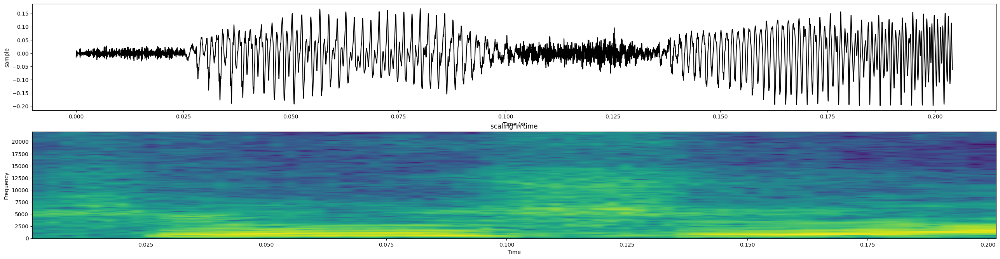

In [3]:
mx2 = scipy.signal.resample(m0, int(len(m0)*0.5))
play_sound(mx2, rate=sr, name="scaling in time", spectrum=1)

But as we can see the duration of the signal is reduced a lot and the speaking speed is too fast, how to keep the duration?
one simple way is to repeat the sounds or cut the sounds in unit of cycles, for example if we detected a segment of voice is composed of a series of cycles with length t0,t1,t2,...,tn, then we can choose some point to repeate or delete in unit of cycle:

for example: 3 cycle becomes 6,5,4,3,2,1,cycles using replication or decimation, and spectrum is expected to be un-changed since we are doing this in unit of fundamental cycles.
```
 t0,t1,t2  =>  t0,t0,t1,t1,t2,t2
 t0,t1,t2  =>  t0,t0,t1,t1,t2
 t0,t1,t2  =>  t0,t0,t1,t2
 t0,t1,t2  =>  t0,t1,t2
 t0,t1,t2  =>  t0,t2
 t0,t1,t2  =>  t0
```

for consonant part, we can choose arbitrary cycles and do the same trick.

This also brings out another task of estimation of fundamental cycles.

# Reference B

https://zhuanlan.zhihu.com/p/110278983


## TSM (Time-scale modification)

In that article, we see author handles the wave concatenation problem differently, it focuses more on how to produce natrual concatenation w/o knowing exact fundamental cycle (since for music-like sound there is no such fundamental cycle), so simply take sample the input sound at large enough  (so most fundamental frequency is kept, but time-varying change is not happend) and concatenate them with natural transition.

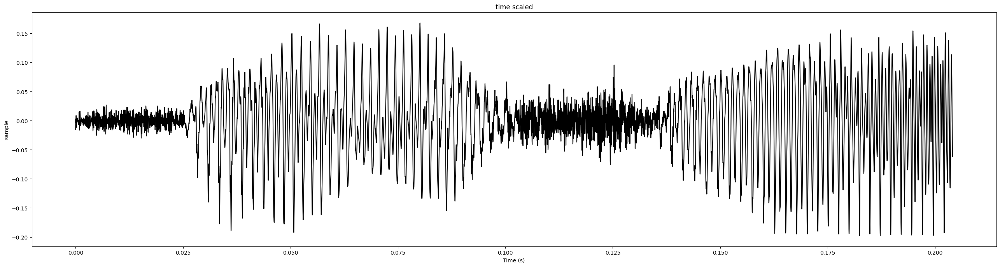

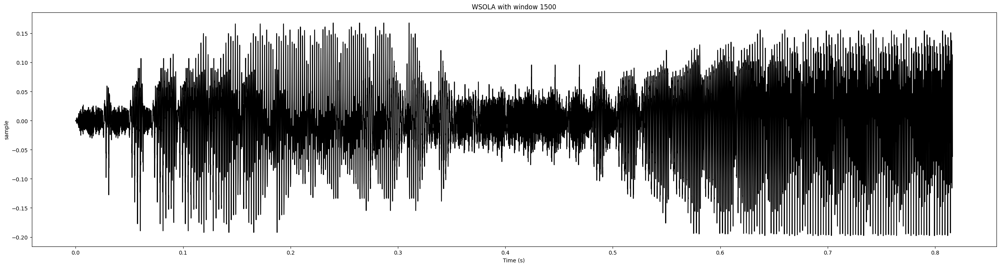

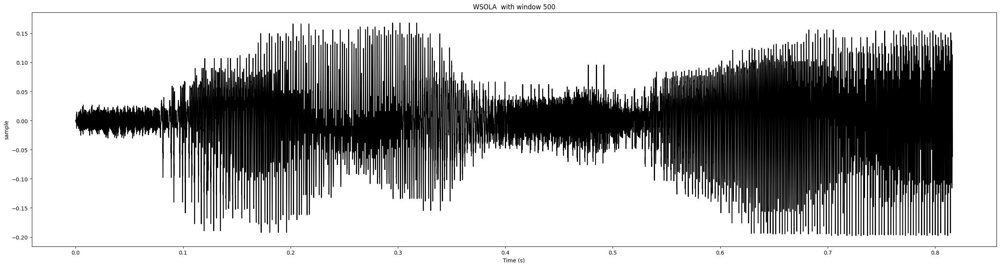

In [14]:
# Waveform similarity Overlap-Add WSOLA

def find_ws(input, is0, ws_wndsize, ovlast):
    # find for best waveform align
    cmax = np.iinfo(np.int32).min
    kmax = 0
    for k in range(-ws_wndsize, ws_wndsize):
        c = scipy.signal.correlate(input[is0+k:is0+k+len(ovlast)], ovlast, "valid")
        if c >= cmax:
            cmax = c
            kmax = k
    is0 = is0 + kmax
    return is0

def WSOLA0(input, out_len, wnd  = 500, ws_wndsize = 0):
    in_len = len(input)
    result = np.zeros([out_len])
    ovlap = int(wnd*1/10)
    window = np.ones([wnd])
    for s in range(ovlap):
        window[wnd-1-s] = window[s] = s/ovlap

    ovlast = []
    for i in range(0, out_len, wnd-ovlap):
        id0 = i
        id1 = min(id0 + wnd, out_len)
        sz = id1 - id0

        is0 = int(i * in_len / out_len)

        if ws_wndsize and len(ovlast) and is0+ws_wndsize+len(ovlast) < in_len:
            is0 = find_ws(input, is0, ws_wndsize, ovlast)

        is1 = is0 + sz

        if (is1 > in_len):
            is1 = in_len
            is0 = is1 - sz

        # sample the input with window and accumulate into result
        result[id0:id1] += (input[is0:is1] * window[0:sz])

        ovlast = input[is1-ovlap*2:is1]

    return result

play_sound(mx2, rate=sr, name="time scaled", spectrum=-1)
play_sound(WSOLA0(mx2, len(mx2)*4, 1500, 50), rate=sr, name="WSOLA with window 1500", spectrum=-1)
play_sound(WSOLA0(mx2, len(mx2)*4, 500, 50), rate=sr, name="WSOLA  with window 500", spectrum=-1)

We can see one very obvious artifact at window size 1500, the consonant is mixed with vowel because of large window size and that window contains both consonant and vowel.

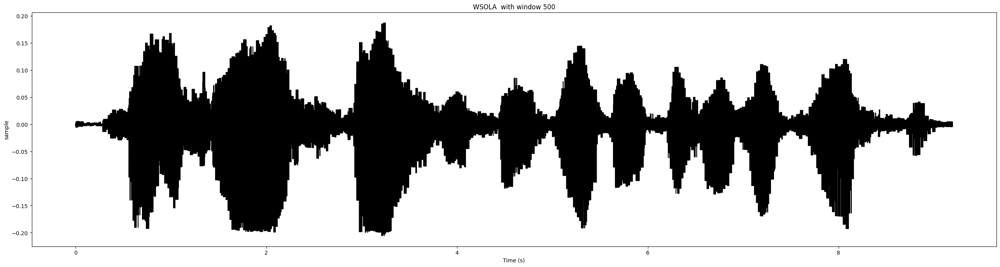

In [11]:
m0 = load_wave("wavs/m0.wav"); sr = 44100
play_sound(WSOLA0(m0, len(m0)*4, 500, 100), rate=sr, name="WSOLA  with window 500", spectrum=-1)

## STFT method

STFT is a versatile DSP framework:

https://courses.engr.illinois.edu/ece420/sp2019/lab3/STFT.pdf


# Method in 3.5 

It mentions IC RTS0072B which can do `Transposing voice`, 
